In [ ]:
import argparse
import os
import time
from pathlib import Path
from typing import List, Tuple

import cv2
import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

from torchvision.transforms.functional import to_tensor
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2, MaskRCNN_ResNet50_FPN_V2_Weights

In [ ]:
# -----------------------------
# Utilities
# -----------------------------
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}


def list_images(p: Path) -> List[Path]:
    if p.is_file():
        return [p]
    files = []
    for ext in IMG_EXTS:
        files.extend(p.glob(f"*{ext}"))
        files.extend(p.glob(f"*{ext.upper()}"))
    files = sorted(list(set(files)))
    return files


def load_image(path: Path) -> Tuple[Image.Image, np.ndarray]:
    """Return PIL RGB + BGR numpy for drawing."""
    pil = Image.open(path).convert("RGB")
    bgr = cv2.cvtColor(np.array(pil), cv2.COLOR_RGB2BGR)
    return pil, bgr


def color_palette(n: int) -> List[Tuple[int, int, int]]:
    """Deterministic distinct-ish colors in BGR."""
    np.random.seed(42)
    cols = []
    for i in range(n):
        hsv = np.array([i / max(1, n), 1.0, 1.0])
        # simple HSV->RGB
        h = hsv[0] * 6
        c = hsv[1] * hsv[2]
        x = c * (1 - abs(h % 2 - 1))
        if 0 <= h < 1: r,g,b=c,x,0
        elif 1 <= h < 2: r,g,b=x,c,0
        elif 2 <= h < 3: r,g,b=0,c,x
        elif 3 <= h < 4: r,g,b=0,x,c
        elif 4 <= h < 5: r,g,b=x,0,c
        else: r,g,b=c,0,x
        m = hsv[2] - c
        r,g,b = (r+m),(g+m),(b+m)
        cols.append((int(b*255), int(g*255), int(r*255)))  # BGR
    return cols


def overlay_instance(
    img_bgr: np.ndarray,
    mask: np.ndarray,
    color: Tuple[int, int, int],
    alpha: float = 0.5,
) -> np.ndarray:
    """Alpha-blend a single mask into image."""
    overlay = img_bgr.copy()
    overlay[mask] = (overlay[mask] * (1 - alpha) + np.array(color) * alpha).astype(np.uint8)
    return overlay



In [ ]:
# -----------------------------
# Inference Core
# -----------------------------
def load_model(device: torch.device):
    weights = MaskRCNN_ResNet50_FPN_V2_Weights.COCO_V1
    model = maskrcnn_resnet50_fpn_v2(weights=weights).to(device).eval()
    class_names = weights.meta["categories"]
    return model, class_names


@torch.inference_mode()
def predict(
    model,
    img_pil: Image.Image,
    device: torch.device,
    score_thr: float = 0.5,
):
    """Run model and filter by score."""
    tensor = to_tensor(img_pil).to(device)
    outputs = model([tensor])[0]
    scores = outputs["scores"].detach().cpu().numpy()
    keep = scores >= score_thr
    result = {
        "boxes": outputs["boxes"][keep].detach().cpu().numpy(),   # (N,4) xyxy
        "labels": outputs["labels"][keep].detach().cpu().numpy(), # (N,)
        "scores": outputs["scores"][keep].detach().cpu().numpy(), # (N,)
        "masks": (outputs["masks"][keep].detach().cpu().numpy() > 0.5).astype(np.uint8),  # (N,1,H,W)->bool
    }
    return result


def save_outputs(
    img_path: Path,
    out_dir: Path,
    img_bgr: np.ndarray,
    pred: dict,
    class_names: List[str],
    draw_bbox: bool = True,
    alpha: float = 0.5,
) -> Tuple[Path, List[Path]]:
    """
    Save:
      - overlay image: <name>_overlay.png
      - each mask: <name>_mask_{i}_{label}.png (binary)
    Return: (overlay_path, [mask_paths...])
    """
    out_dir.mkdir(parents=True, exist_ok=True)
    base = img_path.stem

    N = pred["masks"].shape[0] if "masks" in pred else 0
    colors = color_palette(max(1, N))
    vis = img_bgr.copy()

    mask_paths = []

    for i in range(N):
        mask = pred["masks"][i, 0].astype(bool)
        vis = overlay_instance(vis, mask, colors[i], alpha=alpha)

        if draw_bbox and "boxes" in pred:
            x1, y1, x2, y2 = pred["boxes"][i].astype(int)
            cv2.rectangle(vis, (x1, y1), (x2, y2), colors[i], 2)

        label_id = int(pred["labels"][i])
        label = class_names[label_id] if (0 <= label_id < len(class_names)) else str(label_id)
        score = float(pred["scores"][i])

        # put label
        if draw_bbox and "boxes" in pred:
            txt = f"{label}:{score:.2f}"
            x1, y1, x2, y2 = pred["boxes"][i].astype(int)
            (tw, th), baseline = cv2.getTextSize(txt, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
            cv2.rectangle(vis, (x1, max(0, y1 - th - baseline - 4)), (x1 + tw + 4, y1), colors[i], -1)
            cv2.putText(vis, txt, (x1 + 2, y1 - 2), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1, cv2.LINE_AA)

        # save binary mask
        mask_png = (mask.astype(np.uint8) * 255)
        mask_file = out_dir / f"{base}_mask_{i:02d}_{label}.png"
        cv2.imwrite(str(mask_file), mask_png)
        mask_paths.append(mask_file)

    overlay_path = out_dir / f"{base}_overlay.png"
    cv2.imwrite(str(overlay_path), vis)

    return overlay_path, mask_paths


def show_single_image(rgb_img: np.ndarray, title: str = ""):
    plt.figure(figsize=(8, 8))
    plt.imshow(rgb_img)
    plt.axis("off")
    if title:
        plt.title(title)
    plt.show()


def show_grid(rgb_images: List[np.ndarray], titles: List[str], max_n: int = 5):
    n = min(max_n, len(rgb_images))
    plt.figure(figsize=(16, 8))
    cols = n
    for i in range(n):
        plt.subplot(1, cols, i + 1)
        plt.imshow(rgb_images[i])
        plt.title(titles[i])
        plt.axis("off")
    plt.tight_layout()
    plt.show()


In [ ]:
def run_in_notebook(
    input_path: str,
    output_dir: str = "outputs_maskrcnn",
    score_thr: float = 0.5,
    show: bool = True,
):
    inp = Path(input_path)
    out = Path(output_dir)
    assert inp.exists(), f"Input path not found: {inp}"

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"[Device] Using: {device}")

    model, class_names = load_model(device)

    paths = list_images(inp)
    assert len(paths) > 0, f"No images found at: {inp}"

    total_start = time.time()

    overlay_previews = []
    overlay_titles = []

    for p in tqdm(paths, desc="Processing"):
        start = time.time()
        pil, bgr = load_image(p)
        pred = predict(model, pil, device, score_thr=score_thr)
        overlay_path, _mask_paths = save_outputs(p, out, bgr, pred, class_names)
        elapsed = time.time() - start
        print(f"[Done] {p.name}: {pred['masks'].shape[0] if 'masks' in pred else 0} instances, "
              f"time = {elapsed:.3f}s, saved overlay -> {overlay_path.name}")

        # collect previews
        if show:
            vis_bgr = cv2.imread(str(overlay_path), cv2.IMREAD_COLOR)
            vis_rgb = cv2.cvtColor(vis_bgr, cv2.COLOR_BGR2RGB)
            overlay_previews.append(vis_rgb)
            overlay_titles.append(p.name)

    total_elapsed = time.time() - total_start
    print(f"\n[Summary] Processed {len(paths)} image(s) in {total_elapsed:.3f}s "
          f"({total_elapsed/len(paths):.3f}s per image).")
    print(f"[Output] Saved to: {out.resolve()}")

    # visualization
    if show:
        if len(paths) == 1:
            show_single_image(overlay_previews[0], f"Result: {overlay_titles[0]}")
        else:
            show_grid(overlay_previews, overlay_titles, max_n=5)

Thiết bị: cpu
🔹 Tìm thấy 25 ảnh trong D:\AdvancedThiGiacMayTInh\Week6\data\pets\oxford-iiit-pet\images (chạy 25 ảnh đầu tiên)
✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_1.jpg


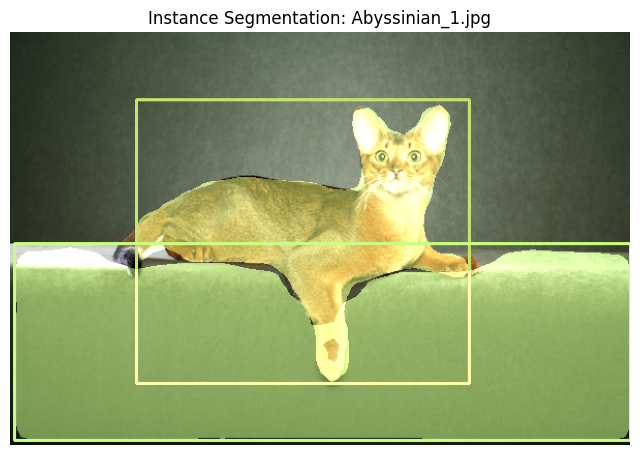

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_10.jpg


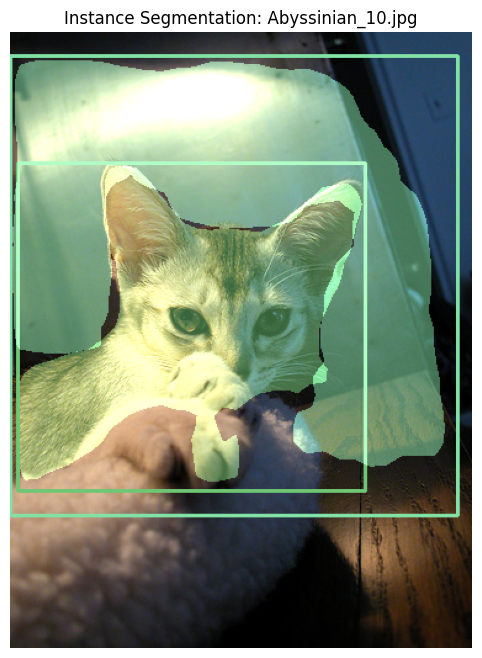

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_100.jpg


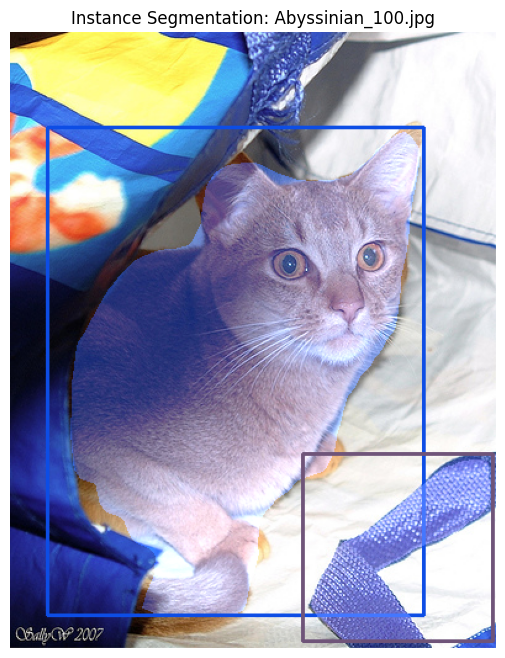

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_101.jpg


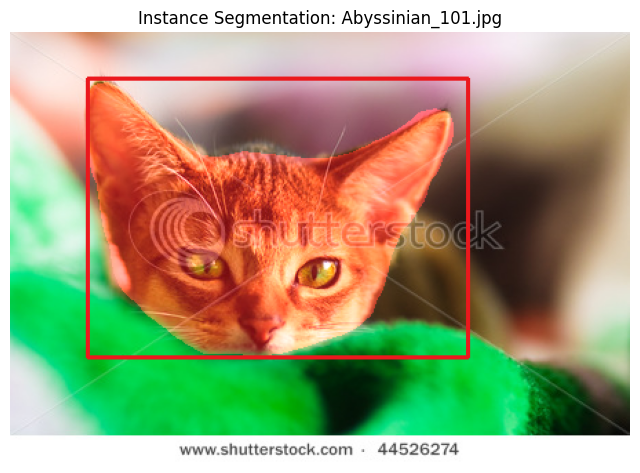

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_102.jpg


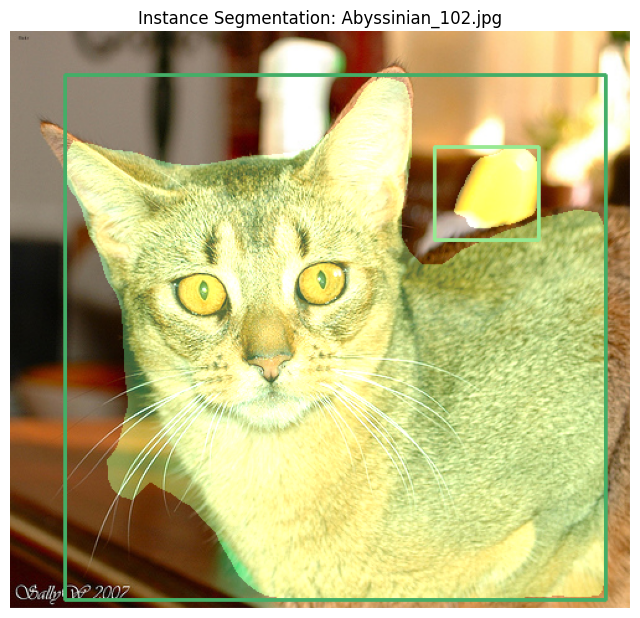

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_103.jpg


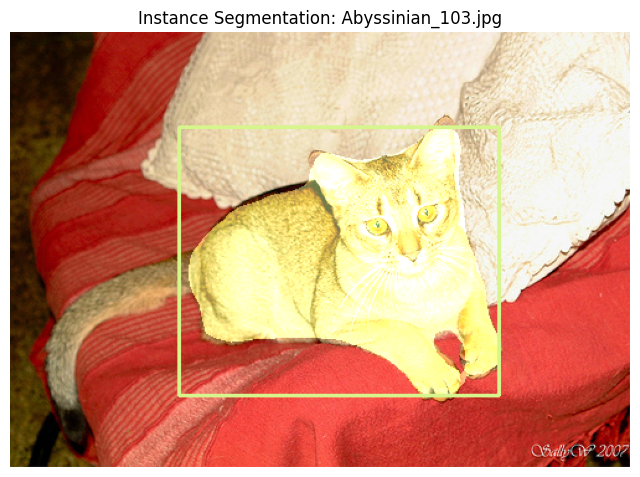

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_104.jpg


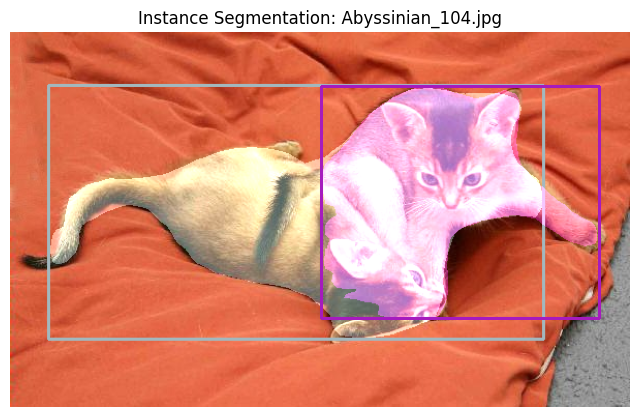

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_105.jpg


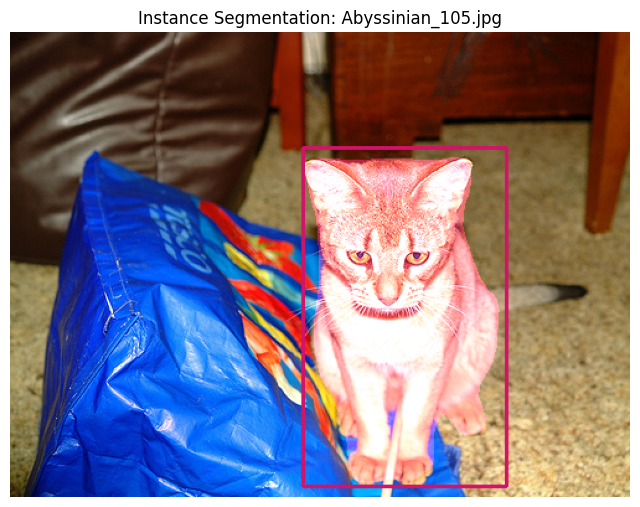

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_106.jpg


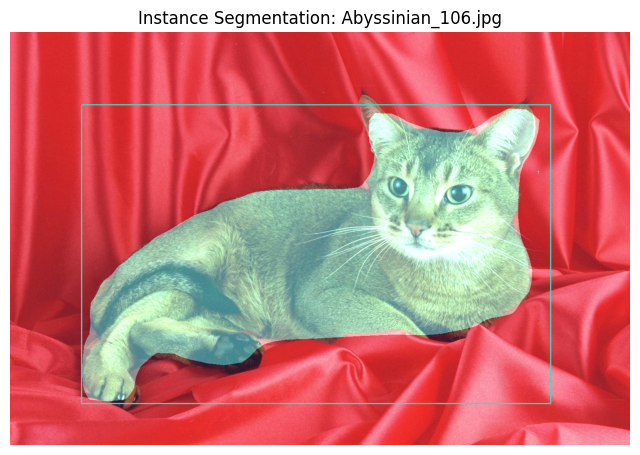

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_107.jpg


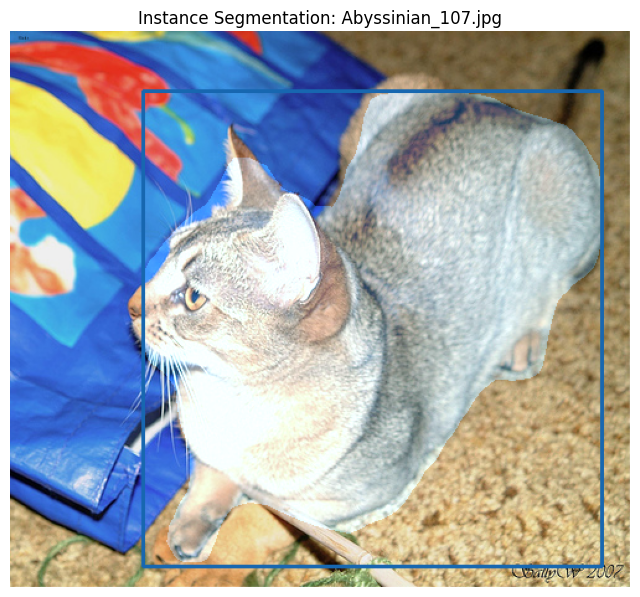

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_108.jpg


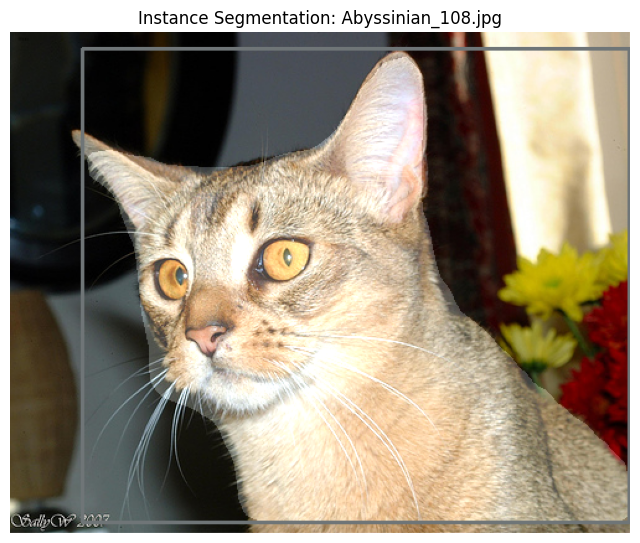

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_109.jpg


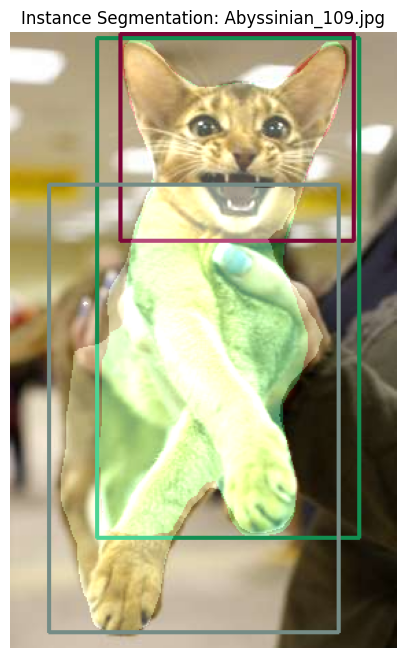

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_11.jpg


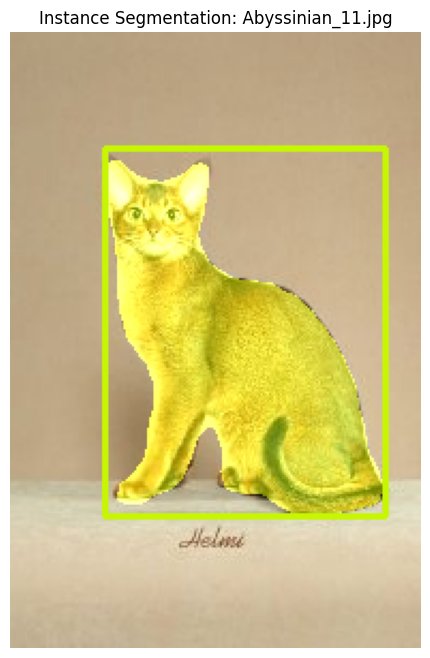

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_110.jpg


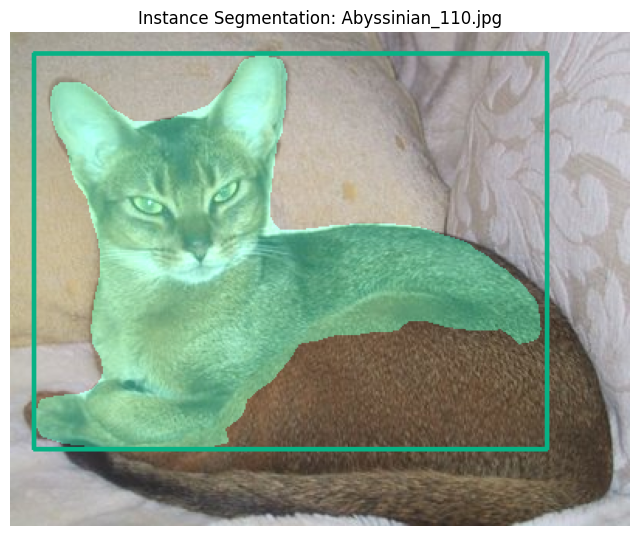

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_111.jpg


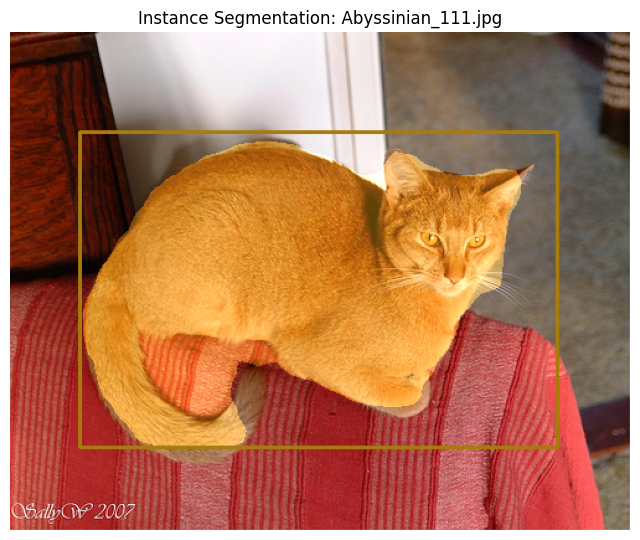

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_112.jpg


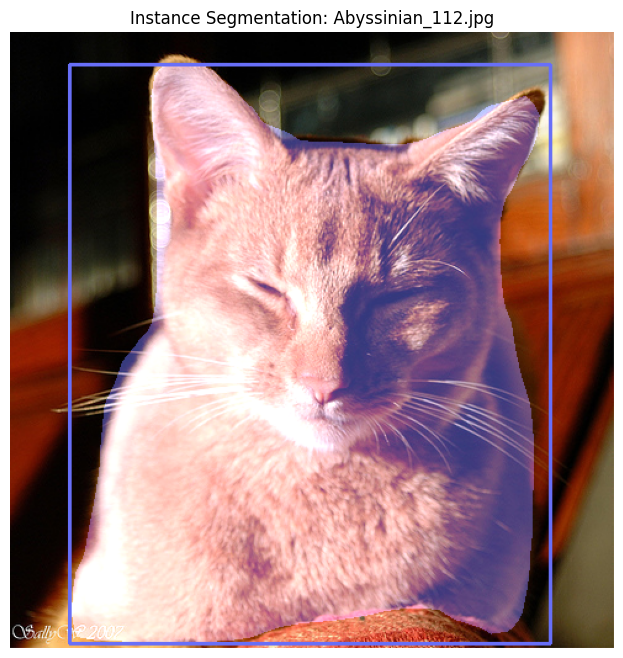

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_113.jpg


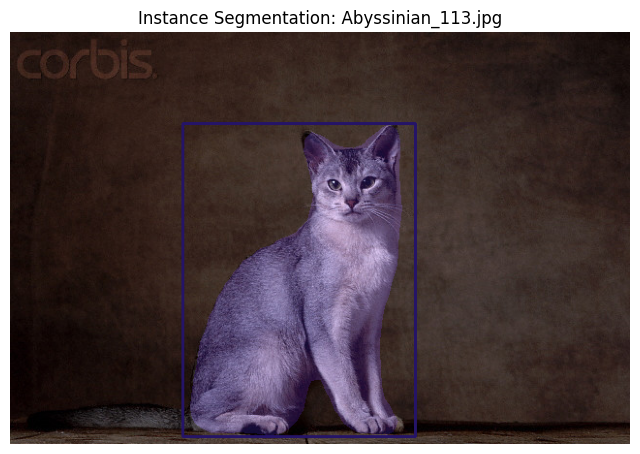

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_114.jpg


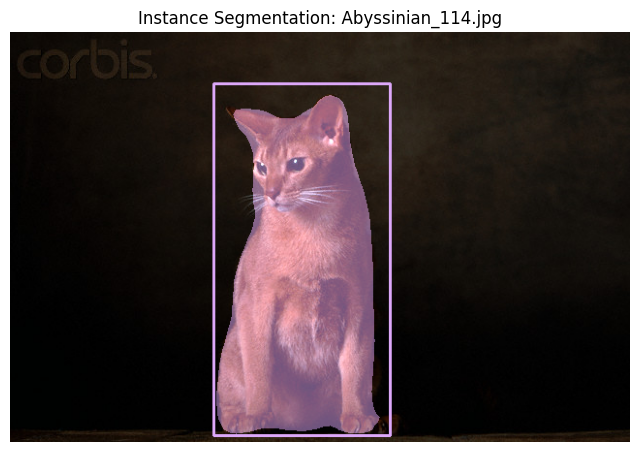

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_115.jpg


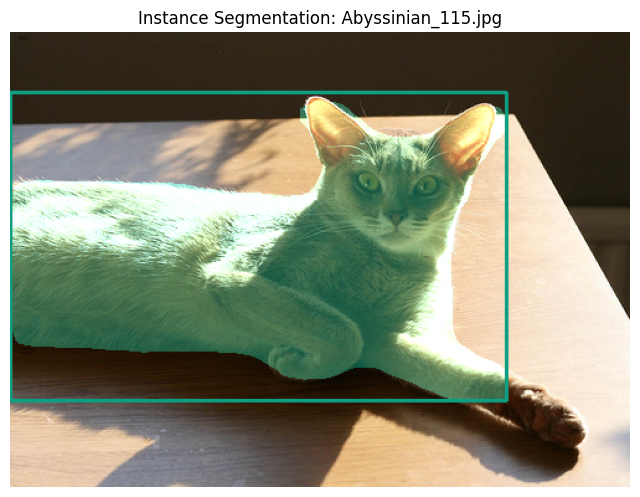

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_116.jpg


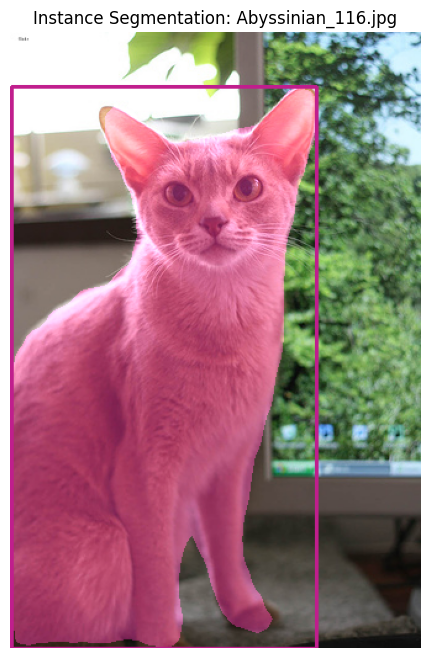

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_117.jpg


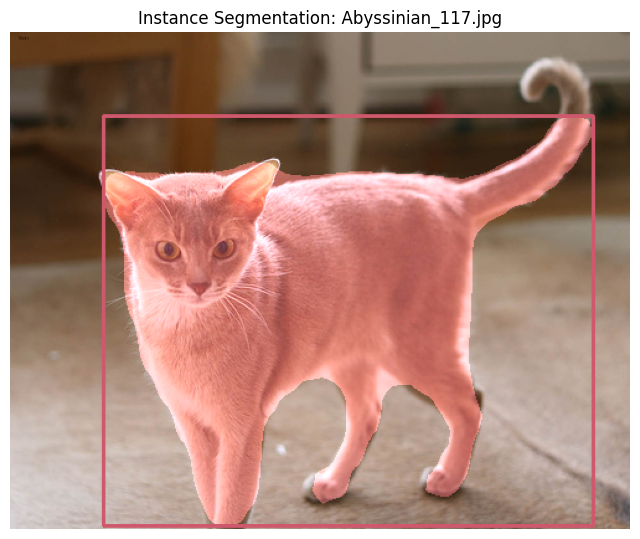

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_118.jpg


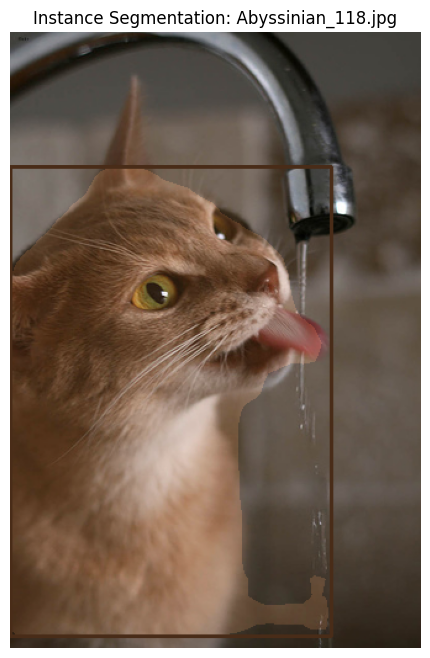

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_119.jpg


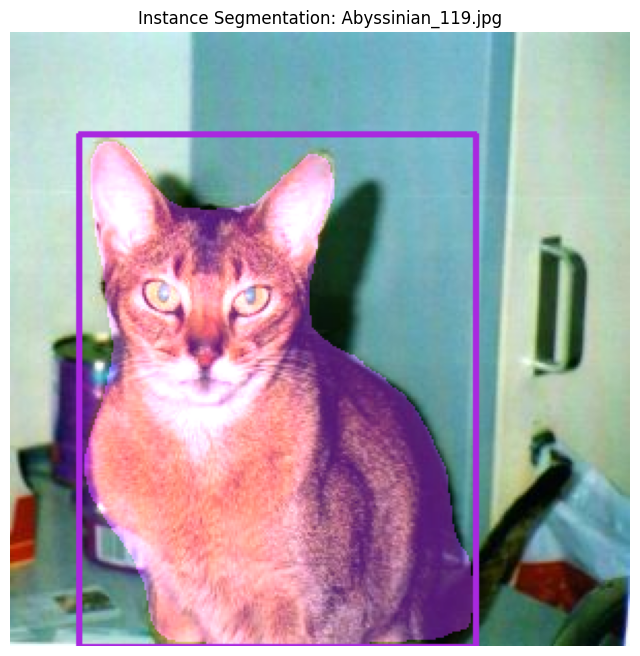

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_12.jpg


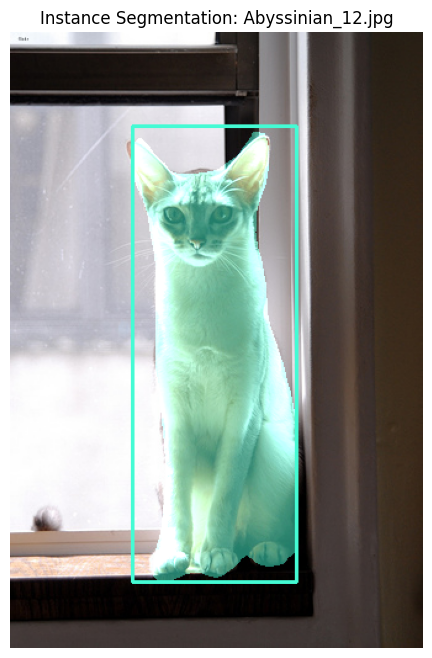

✅ Lưu: D:\AdvancedThiGiacMayTInh\Week6\data\output_masks\Abyssinian_120.jpg


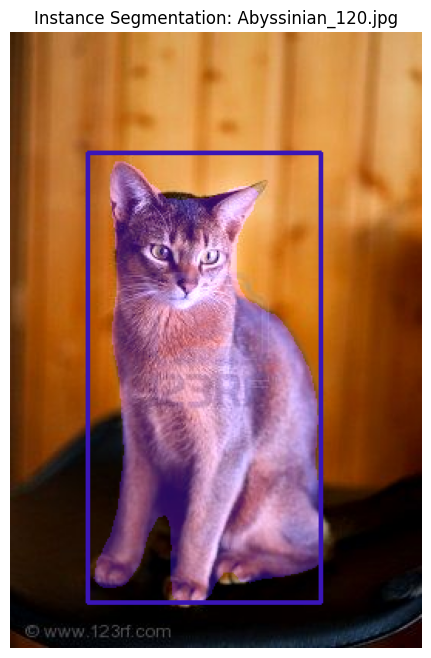

In [ ]:
import torch, torchvision
from torchvision.transforms import functional as F
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2, os

  # ---------------------------------------------------
  # HÀM CHẠY INSTANCE SEGMENTATION TRÊN THƯ MỤC ẢNH
  # ---------------------------------------------------
def run(input_dir, output_dir, score_thr=0.7, show=True, max_images=25):
    device = torch.device("cpu")
    print("Thiết bị:", device)

      # 1️⃣ Tải model pretrained
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")
    model.to(device).eval()

      # 2️⃣ Tạo thư mục lưu output
    os.makedirs(output_dir, exist_ok=True)

      # 3️⃣ Lặp qua từng ảnh trong thư mục
    exts      = [".jpg", ".png", ".jpeg"]
    img_files = [f for f in os.listdir(input_dir) if os.path.splitext(f)[1].lower() in exts]

      # 🔹 Giới hạn chỉ xử lý tối đa 25 ảnh
    img_files = img_files[:max_images]

    print(f"🔹 Tìm thấy {len(img_files)} ảnh trong {input_dir} (chạy {len(img_files)} ảnh đầu tiên)")

    for fname in img_files:
        path  = os.path.join(input_dir, fname)
        img   = Image.open(path).convert("RGB")
        img_t = F.to_tensor(img).unsqueeze(0).to(device)

        with torch.no_grad():
            preds = model(img_t)
        pred  = preds[0]

        scores = pred['scores'].detach().cpu().numpy()
        keep   = scores > score_thr
        boxes  = pred['boxes'][keep].cpu().numpy().astype(int)
        masks  = (pred['masks'][keep] > 0.5).squeeze(1).cpu().numpy()

        img_np = np.array(img)
        for i, box in enumerate(boxes):
            color              = tuple(np.random.randint(0,255,3).tolist())
            mask               = masks[i]
            colored_mask       = np.zeros_like(img_np, dtype=np.uint8)
            colored_mask[mask] = color
            img_np             = cv2.addWeighted(img_np, 1.0, colored_mask, 0.5, 0)
            cv2.rectangle(img_np, (box[0], box[1]), (box[2], box[3]), color, 2)

        save_path = os.path.join(output_dir, fname)
        cv2.imwrite(save_path, cv2.cvtColor(img_np, cv2.COLOR_RGB2BGR))
        print(f"✅ Lưu: {save_path}")

        if show:
            plt.figure(figsize=(8,8))
            plt.imshow(img_np)
            plt.title(f"Instance Segmentation: {fname}")
            plt.axis("off")
            plt.show()

  # ---------------------------------------------------
  # CHẠY DEMO
  # ---------------------------------------------------
input_path = r"D:\AdvancedThiGiacMayTInh\Week6\data\pets\oxford-iiit-pet\images"
output_dir = r"D:\AdvancedThiGiacMayTInh\Week6\data\output_masks"

run(input_path, output_dir, score_thr=0.7, show=True, max_images=25)
